https://arxiv.org/pdf/1909.13589
https://github.com/ZJULearning/MaxSquareLoss


In [1]:
from pathlib import Path
from functools import partial
import dotenv
import pytorch_lightning as pl
import torch
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import ModelCheckpoint, RichProgressBar

from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3, Tier1, Hold, Test
from inz.models.baseline_module import BaselineModule
from inz.util import get_loc_cls_weights, get_wandb_logger, show_masks_comparison
from inz.xview2_strong_baseline.legacy.losses import ComboLoss
from inz.xview2_strong_baseline.legacy.zoo.models import Res34_Unet_Double
from inz.models.baseline_module import BaselineModule
import torch.nn as nn
import torch.nn.functional as F

from torchmetrics.functional.classification import multiclass_f1_score
from torchmetrics.functional.classification import binary_accuracy

In [2]:
import sys  # noqa: I001

sys.path.append("inz/revgrad")

from utils import GradientReversal

sys.path.append("inz/xview2_strong_baseline")

from legacy.zoo.models import Res34_Unet_Double

In [3]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [4]:
BATCH_SIZE = 16

source_events = {
    Tier1: [
        Event.hurricane_michael,
    ],
    Test: [
        Event.hurricane_michael,
    ],
    Hold: [
        Event.hurricane_michael,
    ],
    Tier3: [
        Event.tuscaloosa_tornado,
        # Event.joplin_tornado,
        Event.moore_tornado
    ],
}

target_events={
    # Tier1: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    # Test: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    # Hold: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    Tier3: [
        Event.joplin_tornado
    #     Event.nepal_flooding
    ]
}

dm1 = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    events=source_events,
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm1.prepare_data()
dm1.setup("fit")
dm2 = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    events=target_events,
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm2.prepare_data()
dm2.setup("fit")

print(f"{len(dm1.train_dataloader())} train batches, {len(dm1.val_dataloader())} val batches")

238 train batches, 42 val batches


In [5]:
MODEL_CKPT = "/home/tomek/inz/inz/outputs/split_wind_test_hurricane_matthew_baseline/2024-11-06_05-02-23/checkpoints/experiment_name-0-epoch-79-step-9600-f1-0.601407-last.ckpt"

In [6]:
CLASS_WEIGHTS = torch.Tensor([0.01, 1., 9.0478803, 8.68207691, 12.9632271])

In [7]:
model = BaselineModule.load_from_checkpoint(
    checkpoint_path=MODEL_CKPT,
    model=Res34_Unet_Double(pretrained=True),
    loss=ComboLoss(weights={"dice": 1, "focal": 1}),
    # optimizer_factory=partial(torch.optim.AdamW, lr=0.0002, weight_decay=1e-6),
    # lr=0.000002 gives 0.02 improvement in macro F1, 0.25 for 0.0000005
    optimizer_factory=partial(torch.optim.AdamW, lr=0.0000005, weight_decay=1e-7),
    scheduler_factory=partial(
        torch.optim.lr_scheduler.MultiStepLR,
        gamma=0.5,
        milestones=[5, 11, 17, 23, 29, 33, 47, 50, 60, 70, 90, 110, 130, 150, 170, 180, 190],
    ),
    class_weights=CLASS_WEIGHTS,
).to(device)
model.class_weights = model.class_weights.to(device)

using weights from ResNet34_Weights.IMAGENET1K_V1


In [8]:
optim = model.optimizer_factory(model.parameters())
scheduler = torch.optim.lr_scheduler.MultiStepLR(optim,
    gamma=0.5,
    milestones=[
        5,
        11,
        17,
        23,
        29,
        33,
        47,
        50,
        60,
        70,
        90,
        110,
        130,
        150,
        170,
        180,
        190,
    ],
)

https://arxiv.org/pdf/1909.13589
https://github.com/ZJULearning/MaxSquareLoss


In [9]:
class MaxSquareloss(nn.Module):
    def __init__(self, ignore_index= -1, num_class=19):
        super().__init__()
        self.ignore_index = ignore_index
        self.num_class = num_class

    def forward(self, pred, prob):
        """
        :param pred: predictions (N, C, H, W)
        :param prob: probability of pred (N, C, H, W)
        :return: maximum squares loss
        """
        # prob -= 0.5
        mask = (prob != self.ignore_index)
        loss = -torch.mean(torch.pow(prob, 2)[mask]) / 2
        return loss


class IW_MaxSquareloss(nn.Module):
    """

    #############################
    NO GUARANTEE THIS WORKS
    #############################

    """
    def __init__(self, ignore_index= -1, num_class=19, ratio=0.2):
        super().__init__()
        self.ignore_index = ignore_index
        self.num_class = num_class
        self.ratio = ratio

    def forward(self, pred, prob, label=None):
        """
        :param pred: predictions (N, C, H, W)
        :param prob: probability of pred (N, C, H, W)
        :param label(optional): the map for counting label numbers (N, C, H, W)
        :return: maximum squares loss with image-wise weighting factor
        """
        # prob -= 0.5
        N, C, H, W = prob.size()
        mask = (prob != self.ignore_index)
        maxpred, argpred = torch.max(prob, 1)
        mask_arg = (maxpred != self.ignore_index)
        argpred = torch.where(mask_arg, argpred, torch.ones(1).to(prob.device, dtype=torch.long)*self.ignore_index)
        if label is None:
            label = argpred
        weights = []
        batch_size = prob.size(0)
        for i in range(batch_size):
            hist = torch.histc(label[i].cpu().data.float(), 
                            bins=self.num_class+1, min=-1,
                            max=self.num_class-1).float()
            hist = hist[1:]
            weight = (1/torch.max(torch.pow(hist, self.ratio)*torch.pow(hist.sum(), 1-self.ratio), torch.ones(1))).to(argpred.device)[argpred[i]].detach()
            weights.append(weight)
        weights = torch.stack(weights, dim=0)
        mask = mask_arg.unsqueeze(1).expand_as(prob)
        prior = torch.mean(prob, (2,3), True).detach()
        # loss = -torch.sum((torch.pow(prob, 2)*weights)[mask]) / (batch_size*self.num_class)
        # fix for tensor shape issue
        loss = -torch.sum((torch.pow(prob, 2)*weights.unsqueeze(dim=1))[mask]) / (batch_size*self.num_class)
        return loss

In [10]:
# TODO IW?

class MaxSquareloss(nn.Module):
    def __init__(self, ignore_index= -1, num_class=19):
        super().__init__()
        self.ignore_index = ignore_index
        self.num_class = num_class

    def forward(self, pred, prob):
        """
        :param pred: predictions (N, C, H, W)
        :param prob: probability of pred (N, C, H, W)
        :return: maximum squares loss
        """
        # prob -= 0.5
        mask = (prob != self.ignore_index)
        loss = -torch.mean(torch.pow(prob, 2)[mask]) / 2
        return loss

In [11]:
from tqdm.auto import tqdm
from itertools import islice

source_loader = dm1.train_dataloader()
target_loader = dm2.train_dataloader()

EPOCHS = 40
LAMBDA_TARGET = 0.2

# target_loss = MaxSquareloss(ignore_index=-1, num_class=5).to(device)
target_loss = IW_MaxSquareloss(ignore_index=-1, num_class=5, ratio=0.2).to(device)

for epoch in range(0, EPOCHS + 1):
    batches = zip(source_loader, target_loader)
    n_batches = min(len(source_loader), len(target_loader)) - 1

    total_source_loss = total_target_loss = total_source_f1 = total_target_f1 = 0
    total_source_f1_class = torch.Tensor([0., 0., 0., 0., 0.]).to(device)
    total_target_f1_class = torch.Tensor([0., 0., 0., 0., 0.]).to(device)
    for step, ((source_batch), (target_batch)) in enumerate(
        tqdm(islice(batches, n_batches), total=n_batches, position=0, leave=True), start=1
    ):
        if epoch == 0:
            model.eval()
            torch.set_grad_enabled(False)
        else:
            model.train()
            torch.set_grad_enabled(True)

        s_img_pre, s_mask_pre, s_img_post, s_mask_post = source_batch

        s_img_pre = s_img_pre.to(device)
        s_mask_pre = s_mask_pre.to(device)
        s_img_post = s_img_post.to(device)
        s_mask_post = s_mask_post.to(device)

        source_preds = model(torch.cat([s_img_pre, s_img_post], dim=1))


        if epoch != 0:
            loss_source = torch.stack(
                [
                    model.loss_fn(source_preds[:, i, ...], s_mask_post.to(torch.float)[:, i, ...])
                    for i in range(source_preds.shape[1])
                ]
            )
            loss_source = loss_source.dot(model.class_weights).sum()

            loss_source.backward()
            total_source_loss += loss_source.cpu().item()


        t_img_pre, t_mask_pre, t_img_post, t_mask_post = target_batch

        t_img_pre = t_img_pre.to(device)
        t_mask_pre = t_mask_pre.to(device)
        t_img_post = t_img_post.to(device)
        t_mask_post = t_mask_post.to(device)

        target_preds = model(torch.cat([t_img_pre, t_img_post], dim=1))

        if epoch != 0:
            target_preds_P = F.softmax(target_preds, dim=1)
            target_preds_labels = target_preds_P
            loss_target = LAMBDA_TARGET * target_loss(target_preds, target_preds_labels)

            loss_target.backward()
            total_target_loss += loss_target.cpu().item()

        if epoch != 0:
            optim.step()
            optim.zero_grad()

        f1_source = multiclass_f1_score(source_preds.argmax(dim=1), s_mask_post.argmax(dim=1), num_classes=5)
        total_source_f1 += f1_source

        f1_source_class = multiclass_f1_score(source_preds.argmax(dim=1), s_mask_post.argmax(dim=1), num_classes=5, average='none')
        total_source_f1_class += f1_source_class

        with torch.no_grad():
            label_preds_target = model(torch.cat([t_img_pre, t_img_post], dim=1))
            f1_target = multiclass_f1_score(
                label_preds_target.argmax(dim=1), t_mask_post.to(device).argmax(dim=1), num_classes=5
            )
            total_target_f1 += f1_target

            f1_target_class = multiclass_f1_score(
                label_preds_target.argmax(dim=1), t_mask_post.to(device).argmax(dim=1), num_classes=5, average='none'
            )
            total_target_f1_class += f1_target_class

        if epoch != 0:
            tqdm.write(
                f"STEP {(epoch-1) * BATCH_SIZE + step:03d}: source_loss={loss_source.item():.4f}, target_loss={loss_target.item():.4f}, "
                f"source_f1={f1_source:.4f}, "
                f"target_f1={f1_target:.4f}, "
                f"\nsource_f1_class={f1_source_class}"
                f"\ntarget_f1_class={f1_target_class}"
            )

    if epoch != 0:
        scheduler.step()

    mean_source_loss = total_source_loss / n_batches
    mean_target_loss = total_target_loss / n_batches
    mean_f1_source = total_source_f1 / n_batches
    mean_f1_target = total_target_f1 / n_batches
    mean_f1_source_class = total_source_f1_class / n_batches
    mean_f1_target_class = total_target_f1_class / n_batches
    tqdm.write(
        f"############## EPOCH {epoch:03d}: source_loss={mean_source_loss:.4f}, target_loss={mean_target_loss:.4f}, "
        f"source_f1={mean_f1_source:.4f}, "
        f"target_f1={mean_f1_target:.4f}, "
        f"\nsource_f1_class={mean_f1_source_class}"
        f"\ntarget_f1_class={mean_f1_target_class}"
    )

  0%|          | 0/31 [00:00<?, ?it/s]

############## EPOCH 000: source_loss=0.0000, target_loss=0.0000, source_f1=0.6348, target_f1=0.7572, 
source_f1_class=tensor([0.9873, 0.7073, 0.4292, 0.4236, 0.6266], device='cuda:0')
target_f1_class=tensor([0.9860, 0.7954, 0.5701, 0.5928, 0.8416], device='cuda:0')


  0%|          | 0/31 [00:00<?, ?it/s]

STEP 001: source_loss=20.4609, target_loss=-0.0430, source_f1=0.6197, target_f1=0.7706, 
source_f1_class=tensor([0.9884, 0.8199, 0.5352, 0.7390, 0.0158], device='cuda:0')
target_f1_class=tensor([0.9785, 0.8375, 0.6197, 0.6624, 0.7549], device='cuda:0')
STEP 002: source_loss=17.8013, target_loss=-0.0430, source_f1=0.6717, target_f1=0.7653, 
source_f1_class=tensor([0.9911, 0.8050, 0.6787, 0.8840, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9787, 0.7523, 0.7238, 0.6511, 0.7204], device='cuda:0')
STEP 003: source_loss=12.3194, target_loss=-0.0432, source_f1=0.7368, target_f1=0.8412, 
source_f1_class=tensor([0.9884, 0.8382, 0.5827, 0.5215, 0.7532], device='cuda:0')
target_f1_class=tensor([0.9801, 0.7936, 0.7663, 0.8368, 0.8292], device='cuda:0')
STEP 004: source_loss=14.1455, target_loss=-0.0422, source_f1=0.7001, target_f1=0.7822, 
source_f1_class=tensor([0.9918, 0.8506, 0.6564, 0.3320, 0.6695], device='cuda:0')
target_f1_class=tensor([0.9867, 0.8316, 0.7326, 0.5424, 0.8176], devic

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 017: source_loss=11.5003, target_loss=-0.0428, source_f1=0.7650, target_f1=0.7912, 
source_f1_class=tensor([0.9874, 0.7924, 0.7184, 0.5667, 0.7600], device='cuda:0')
target_f1_class=tensor([0.9827, 0.8427, 0.7483, 0.5847, 0.7979], device='cuda:0')
STEP 018: source_loss=11.9296, target_loss=-0.0426, source_f1=0.7499, target_f1=0.7695, 
source_f1_class=tensor([0.9899, 0.8003, 0.6355, 0.6523, 0.6717], device='cuda:0')
target_f1_class=tensor([0.9830, 0.7812, 0.7445, 0.5946, 0.7439], device='cuda:0')
STEP 019: source_loss=7.0450, target_loss=-0.0424, source_f1=0.8436, target_f1=0.7906, 
source_f1_class=tensor([0.9903, 0.8454, 0.7307, 0.8128, 0.8389], device='cuda:0')
target_f1_class=tensor([0.9835, 0.8335, 0.6749, 0.6423, 0.8190], device='cuda:0')
STEP 020: source_loss=13.4284, target_loss=-0.0424, source_f1=0.7271, target_f1=0.8075, 
source_f1_class=tensor([0.9874, 0.8439, 0.5285, 0.7126, 0.5630], device='cuda:0')
target_f1_class=tensor([0.9842, 0.8172, 0.7310, 0.6593, 0.8459], device

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 033: source_loss=23.4078, target_loss=-0.0422, source_f1=0.5390, target_f1=0.7467, 
source_f1_class=tensor([0.9908, 0.7818, 0.3849, 0.5376, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9850, 0.8137, 0.7063, 0.4621, 0.7662], device='cuda:0')
STEP 034: source_loss=8.4082, target_loss=-0.0427, source_f1=0.8122, target_f1=0.7956, 
source_f1_class=tensor([0.9901, 0.7733, 0.7067, 0.8222, 0.7690], device='cuda:0')
target_f1_class=tensor([0.9814, 0.7834, 0.6945, 0.7545, 0.7642], device='cuda:0')
STEP 035: source_loss=6.6402, target_loss=-0.0423, source_f1=0.8384, target_f1=0.5306, 
source_f1_class=tensor([0.9901, 0.8433, 0.7401, 0.6834, 0.9351], device='cuda:0')
target_f1_class=tensor([0.9878, 0.8110, 0.6389, 0.1841, 0.0311], device='cuda:0')
STEP 036: source_loss=8.7982, target_loss=-0.0426, source_f1=0.7852, target_f1=0.7451, 
source_f1_class=tensor([0.9905, 0.7683, 0.6430, 0.6746, 0.8494], device='cuda:0')
target_f1_class=tensor([0.9843, 0.8655, 0.7732, 0.2694, 0.8328], device='

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 049: source_loss=11.7068, target_loss=-0.0428, source_f1=0.7803, target_f1=0.7350, 
source_f1_class=tensor([0.9923, 0.8771, 0.7622, 0.9119, 0.3582], device='cuda:0')
target_f1_class=tensor([0.9818, 0.7879, 0.6638, 0.5289, 0.7129], device='cuda:0')
STEP 050: source_loss=7.4946, target_loss=-0.0427, source_f1=0.8376, target_f1=0.7539, 
source_f1_class=tensor([0.9909, 0.8759, 0.7468, 0.7495, 0.8248], device='cuda:0')
target_f1_class=tensor([0.9829, 0.8389, 0.7043, 0.4564, 0.7868], device='cuda:0')
STEP 051: source_loss=9.4551, target_loss=-0.0425, source_f1=0.7789, target_f1=0.7756, 
source_f1_class=tensor([0.9847, 0.8025, 0.5050, 0.6895, 0.9128], device='cuda:0')
target_f1_class=tensor([0.9834, 0.8503, 0.7651, 0.4641, 0.8152], device='cuda:0')
STEP 052: source_loss=23.5435, target_loss=-0.0432, source_f1=0.5308, target_f1=0.8008, 
source_f1_class=tensor([0.9859, 0.8244, 0.4522, 0.2340, 0.1573], device='cuda:0')
target_f1_class=tensor([0.9716, 0.6712, 0.6908, 0.8543, 0.8159], device=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 065: source_loss=10.9529, target_loss=-0.0430, source_f1=0.7505, target_f1=0.7768, 
source_f1_class=tensor([0.9919, 0.7159, 0.7409, 0.6458, 0.6578], device='cuda:0')
target_f1_class=tensor([0.9777, 0.8075, 0.7308, 0.5724, 0.7956], device='cuda:0')
STEP 066: source_loss=11.4451, target_loss=-0.0427, source_f1=0.7816, target_f1=0.7692, 
source_f1_class=tensor([0.9924, 0.8637, 0.7074, 0.8843, 0.4600], device='cuda:0')
target_f1_class=tensor([0.9811, 0.8281, 0.7841, 0.4874, 0.7652], device='cuda:0')
STEP 067: source_loss=9.5856, target_loss=-0.0428, source_f1=0.7913, target_f1=0.8018, 
source_f1_class=tensor([0.9880, 0.8292, 0.6870, 0.6576, 0.7947], device='cuda:0')
target_f1_class=tensor([0.9797, 0.8533, 0.7042, 0.6906, 0.7814], device='cuda:0')
STEP 068: source_loss=16.7070, target_loss=-0.0421, source_f1=0.8689, target_f1=0.7737, 
source_f1_class=tensor([0.9931, 0.8144, 0.7695, 0.8989, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9887, 0.8495, 0.6929, 0.5883, 0.7491], device

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 081: source_loss=7.6886, target_loss=-0.0426, source_f1=0.8236, target_f1=0.7035, 
source_f1_class=tensor([0.9861, 0.7818, 0.7152, 0.8110, 0.8237], device='cuda:0')
target_f1_class=tensor([0.9853, 0.7939, 0.5693, 0.4582, 0.7109], device='cuda:0')
STEP 082: source_loss=12.1722, target_loss=-0.0423, source_f1=0.7458, target_f1=0.7456, 
source_f1_class=tensor([0.9904, 0.8332, 0.7811, 0.4856, 0.6387], device='cuda:0')
target_f1_class=tensor([0.9861, 0.8180, 0.5800, 0.6527, 0.6910], device='cuda:0')
STEP 083: source_loss=15.8601, target_loss=-0.0430, source_f1=0.6788, target_f1=0.8318, 
source_f1_class=tensor([0.9832, 0.8065, 0.4862, 0.6538, 0.4643], device='cuda:0')
target_f1_class=tensor([0.9811, 0.8575, 0.8194, 0.6953, 0.8056], device='cuda:0')
STEP 084: source_loss=8.6221, target_loss=-0.0426, source_f1=0.7961, target_f1=0.7316, 
source_f1_class=tensor([0.9908, 0.7342, 0.6397, 0.8763, 0.7396], device='cuda:0')
target_f1_class=tensor([0.9782, 0.8099, 0.7054, 0.4471, 0.7175], device=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 097: source_loss=8.4138, target_loss=-0.0427, source_f1=0.8016, target_f1=0.7603, 
source_f1_class=tensor([0.9928, 0.7377, 0.5847, 0.8560, 0.8369], device='cuda:0')
target_f1_class=tensor([0.9786, 0.8561, 0.6737, 0.5106, 0.7826], device='cuda:0')
STEP 098: source_loss=8.5853, target_loss=-0.0426, source_f1=0.8286, target_f1=0.8104, 
source_f1_class=tensor([0.9900, 0.8651, 0.7279, 0.8395, 0.7207], device='cuda:0')
target_f1_class=tensor([0.9852, 0.8312, 0.7389, 0.6462, 0.8507], device='cuda:0')
STEP 099: source_loss=12.4041, target_loss=-0.0425, source_f1=0.7482, target_f1=0.8134, 
source_f1_class=tensor([0.9852, 0.8311, 0.5657, 0.7574, 0.6014], device='cuda:0')
target_f1_class=tensor([0.9825, 0.8176, 0.7325, 0.7053, 0.8290], device='cuda:0')
STEP 100: source_loss=9.4013, target_loss=-0.0428, source_f1=0.7917, target_f1=0.8446, 
source_f1_class=tensor([0.9914, 0.7818, 0.6828, 0.7256, 0.7769], device='cuda:0')
target_f1_class=tensor([0.9805, 0.8562, 0.7723, 0.7354, 0.8786], device='

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 113: source_loss=12.9064, target_loss=-0.0429, source_f1=0.7161, target_f1=0.7113, 
source_f1_class=tensor([0.9849, 0.7463, 0.5411, 0.5615, 0.7467], device='cuda:0')
target_f1_class=tensor([0.9784, 0.7704, 0.6626, 0.4436, 0.7014], device='cuda:0')
STEP 114: source_loss=12.9173, target_loss=-0.0428, source_f1=0.7306, target_f1=0.7590, 
source_f1_class=tensor([0.9827, 0.8286, 0.5803, 0.6664, 0.5952], device='cuda:0')
target_f1_class=tensor([0.9750, 0.8320, 0.6756, 0.5468, 0.7655], device='cuda:0')
STEP 115: source_loss=10.8494, target_loss=-0.0425, source_f1=0.7834, target_f1=0.8046, 
source_f1_class=tensor([0.9862, 0.8502, 0.6668, 0.8214, 0.5922], device='cuda:0')
target_f1_class=tensor([0.9819, 0.8119, 0.7234, 0.6525, 0.8532], device='cuda:0')
STEP 116: source_loss=11.9892, target_loss=-0.0426, source_f1=0.7610, target_f1=0.6932, 
source_f1_class=tensor([0.9899, 0.8486, 0.5814, 0.7809, 0.6043], device='cuda:0')
target_f1_class=tensor([0.9772, 0.7652, 0.4643, 0.4844, 0.7748], devic

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 129: source_loss=8.4995, target_loss=-0.0431, source_f1=0.8064, target_f1=0.7577, 
source_f1_class=tensor([0.9929, 0.7874, 0.6594, 0.7724, 0.8198], device='cuda:0')
target_f1_class=tensor([0.9790, 0.8182, 0.7449, 0.6795, 0.5670], device='cuda:0')
STEP 130: source_loss=8.6204, target_loss=-0.0421, source_f1=0.8071, target_f1=0.8051, 
source_f1_class=tensor([0.9907, 0.8161, 0.7373, 0.7252, 0.7662], device='cuda:0')
target_f1_class=tensor([0.9861, 0.8380, 0.8040, 0.5789, 0.8186], device='cuda:0')
STEP 131: source_loss=10.7172, target_loss=-0.0426, source_f1=0.7907, target_f1=0.7800, 
source_f1_class=tensor([0.9855, 0.8143, 0.6321, 0.7958, 0.7257], device='cuda:0')
target_f1_class=tensor([0.9838, 0.8223, 0.7630, 0.5941, 0.7367], device='cuda:0')
STEP 132: source_loss=12.6762, target_loss=-0.0430, source_f1=0.7551, target_f1=0.7673, 
source_f1_class=tensor([0.9910, 0.8292, 0.6231, 0.9132, 0.4193], device='cuda:0')
target_f1_class=tensor([0.9852, 0.8300, 0.6257, 0.6073, 0.7884], device=

KeyboardInterrupt: 

In [12]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

from torchvision.utils import draw_segmentation_masks, make_grid  # type: ignore[import-untyped]
import numpy as np
from PIL import Image


In [13]:
class SemanticSegmentationTarget:
    def __init__(self, category, mask):
        self.category = category
        self.mask = mask
        if torch.cuda.is_available():
            self.mask = self.mask.cuda()

    def __call__(self, model_output):
        return (model_output[self.category, :, :] * self.mask).sum()

In [14]:
dm_test = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    split_events={
        "test": target_events
    },
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm_test.prepare_data()
dm_test.setup("test")

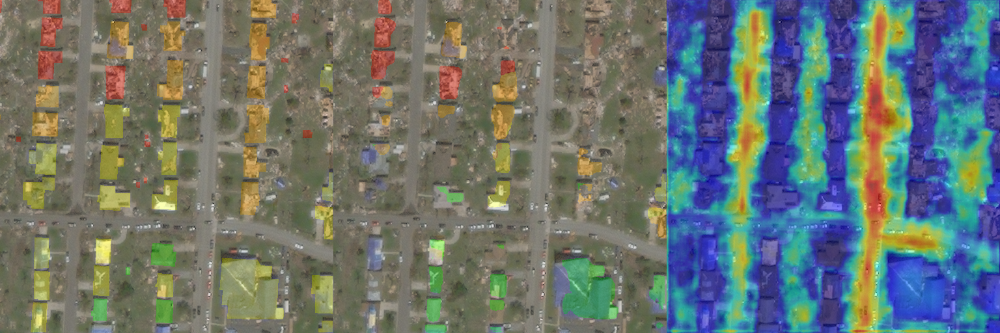

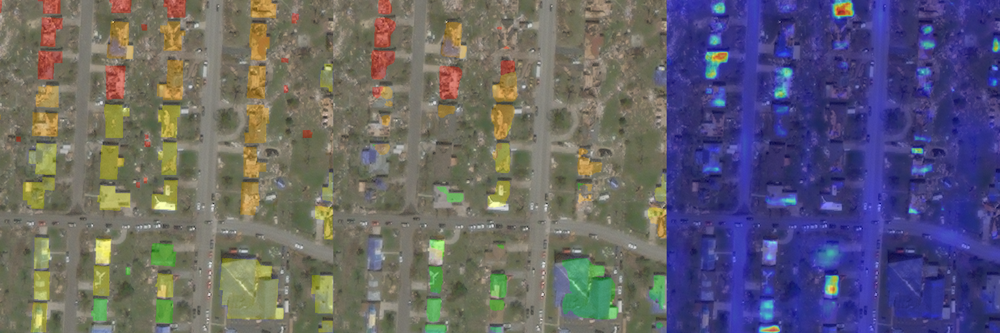

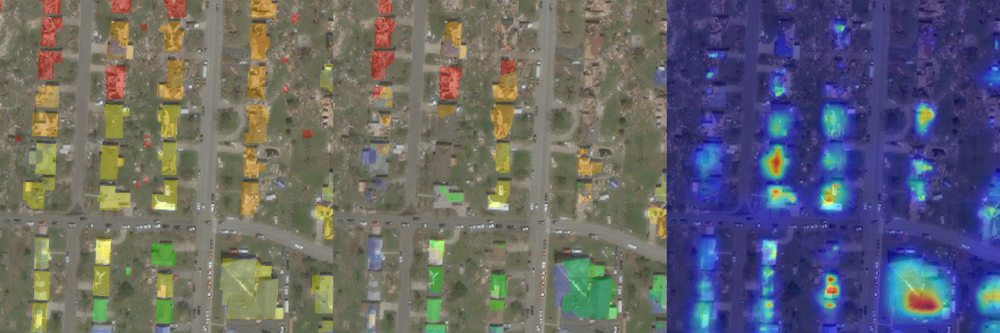

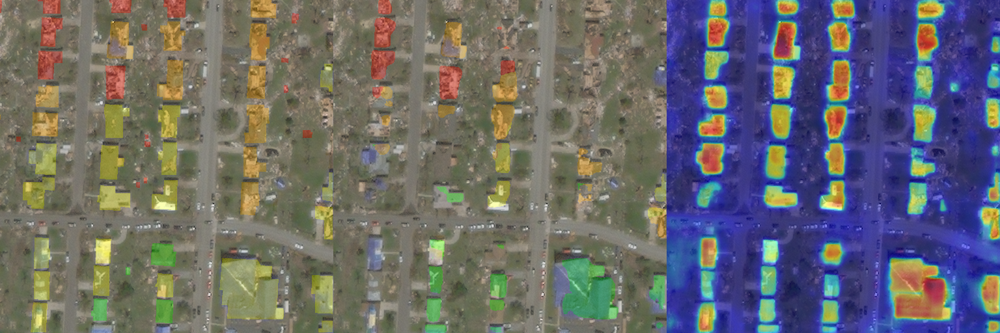

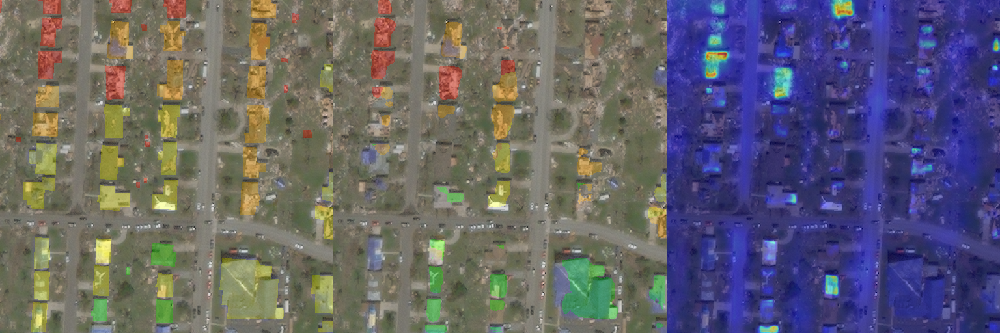

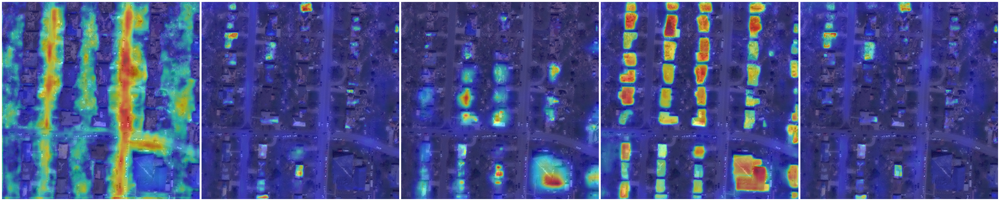

In [15]:
IMG_NAME = "joplin-tornado_00000000_post_disaster_patch3"
# IMG_NAME = "hurricane-harvey_00000030_post_disaster_patch0"

IMG_PATH_POST = Path(f"data/xBD_processed_512/images/tier3/images/{IMG_NAME}.png")

# FarSeg
# target_layers = model.model.module.decoder.blocks

# Baseline
target_layers = [
    model.model.conv6_2,
    model.model.conv7_2,
    model.model.conv8_2,
    model.model.conv9_2,
    model.model.conv10,
    model.model.res,
]

# region boring
item = dm_test._test_dataset[dm_test._test_dataset._image_paths_post.index(IMG_PATH_POST)]
image_pre, mask_pre, image_post, mask_post = item

with torch.no_grad():
    m = model.to(device)
    preds = m(torch.cat([torch.unsqueeze(image_pre, 0), torch.unsqueeze(image_post, 0)], dim=1).to(device))

for c in range(0, 5):

    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GradCAM(
        model=model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets)[
            0, :
        ]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    colors = [
        (128, 128, 128),
        (0, 255, 0),
        (244, 255, 0),
        (255, 174, 0),
        (255, 0, 0),
        (255, 255, 255),
    ]
    preds_masks = draw_segmentation_masks(
        ((image_post + 1) * 127.5).to(torch.uint8), torch.nn.functional.one_hot(preds[0].argmax(dim=0), num_classes=5).moveaxis(-1, 0).to(bool), colors=colors, alpha=0.3
    )
    ground_truth_masks = draw_segmentation_masks(
        ((image_post + 1) * 127.5).to(torch.uint8), mask_post.to(bool), colors=colors, alpha=0.3
    )
    comp = np.hstack((ground_truth_masks.moveaxis(0, -1).detach().cpu().numpy(), preds_masks.moveaxis(0, -1).detach().cpu().numpy(), cam_image))
    display(Image.fromarray(comp))

acts = []
for c in range(0, 5):
    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GradCAM(
        model=model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets)[
            0, :
        ]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    acts.append(torch.from_numpy(cam_image).moveaxis(-1, 0))
comp_acts = make_grid(torch.stack(acts), padding=5, pad_value=255)
display(Image.fromarray(comp_acts.moveaxis(0, -1).numpy()))

# endregion